In [177]:
import os, sys
sys.path.append('../scripts')
import snp_path  # noqa: F401  # scripts/ subfolders -> sys.path
import smyle_handles
import dcpp_handles
import smyle_metrics 
import matplotlib.pyplot as plt 
import numpy as np

dcpp_handles.inventory()

poolable DCPP cubes:
  PRECT   lead 13-60  ->  66 members: HadGEM3-GC31-MM(N=10,J=59,init=11), CanESM5(N=40,J=60,init=1), EC-Earth3(N=16,J=51,init=11)
  PRECT   lead 2-4    ->  26 members: HadGEM3-GC31-MM(N=10,J=59,init=11), EC-Earth3(N=16,J=51,init=11)
  SLP     lead 13-60  ->  46 members: HadGEM3-GC31-MM(N=10,J=59,init=11), CanESM5(N=20,J=60,init=1), EC-Earth3(N=16,J=51,init=11)
  SLP     lead 2-4    ->  26 members: HadGEM3-GC31-MM(N=10,J=59,init=11), EC-Earth3(N=16,J=51,init=11)
  TREFHT  lead 13-60  ->  66 members: HadGEM3-GC31-MM(N=10,J=59,init=11), CanESM5(N=40,J=60,init=1), EC-Earth3(N=16,J=52,init=11)
  TREFHT  lead 2-4    ->  26 members: HadGEM3-GC31-MM(N=10,J=59,init=11), EC-Earth3(N=16,J=52,init=11)


{('SLP', '2-4'): ['HadGEM3-GC31-MM', 'EC-Earth3'],
 ('SLP', '13-60'): ['HadGEM3-GC31-MM', 'CanESM5', 'EC-Earth3'],
 ('TREFHT', '2-4'): ['HadGEM3-GC31-MM', 'EC-Earth3'],
 ('TREFHT', '13-60'): ['HadGEM3-GC31-MM', 'CanESM5', 'EC-Earth3'],
 ('PRECT', '2-4'): ['HadGEM3-GC31-MM', 'EC-Earth3'],
 ('PRECT', '13-60'): ['HadGEM3-GC31-MM', 'CanESM5', 'EC-Earth3']}

In [ ]:
data = dcpp_handles.get(lead='13-60', var='SLP', remove_gm=True) # set remove_gm=True for SLP 
F = data.F # (N_MEMBERS, N_TIME, N_LAT, N_LON)
g = data.G # (N_TIME, N_LAT, N_LON)
s = np.mean(F, axis=0)
YEAR = data.YEAR # (N_TIME)
MONTH = data.MONTH  # (N_TIME) although they are all the ssame 

In [2]:
F.shape

(46, 48, 37, 72)

In [3]:
def remove_ticks(axs):
    for ax in axs:
        ax.set_xticks([])
        ax.set_yticks([])

def add_colorbars(fig, ims, axs, fraction=0.04, pad=0.2):
    for i, im in enumerate(ims):
        fig.colorbar(im, ax=axs[i], fraction=fraction, pad=pad)

In [23]:
g_tiled = np.broadcast_to(g, (F.shape[0], g.shape[0], g.shape[1], g.shape[2]))
print(g_tiled.shape)
assert np.abs(np.mean(g_tiled, axis=0) - g).all() <= 1e-7, 'Tiling observations were not successful.'

(46, 48, 37, 72)


In [53]:
def pearson_coeff_pairwise(F, G):
    """Pearson correlation between member and obs -> (N_MEMBER, N_LAT, N_LON) """
    def helper_mean(X):
        return np.mean(X, axis=1).reshape(X.shape[0], -1, X.shape[2], X.shape[3])
        
    num = np.mean((F - helper_mean(F)) * (G - helper_mean(G)), axis=1)
    den = np.std(F, axis=1) * np.std(G, axis=1)
    return num / den

def pearson_coeff_F_pairwise(F):
    """ Pearson correlation between pairs of members -> (N_MEMBER, N_MEMBER, N_LAT, N_LON) """
    N_MEMBER, N_LAT, N_LON = F.shape[0], F.shape[2], F.shape[3]
    out = np.nan * np.ones((N_MEMBER, N_MEMBER, N_LAT, N_LON))
    for n in range(N_MEMBER):
        gg = F[n, :, :, :]
        gg_tiled = np.broadcast_to(gg, (F.shape[0], gg.shape[0], gg.shape[1], gg.shape[2]))
        pairwise = pearson_coeff_pairwise(F, gg_tiled)
        out[n, :, :, :] = pairwise
    return out 

In [127]:
rho_o_pairwise = pearson_coeff_pairwise(F, g_tiled)
# rho_o = smyle_metrics.pearson_coeff(s, g)
# rho_m_pairwise = pearson_coeff_F_pairwise(F)
print(rho_o_pairwise.shape)
print(rho_m_pairwise.shape)

(46, 37, 72)
(46, 46, 37, 72)


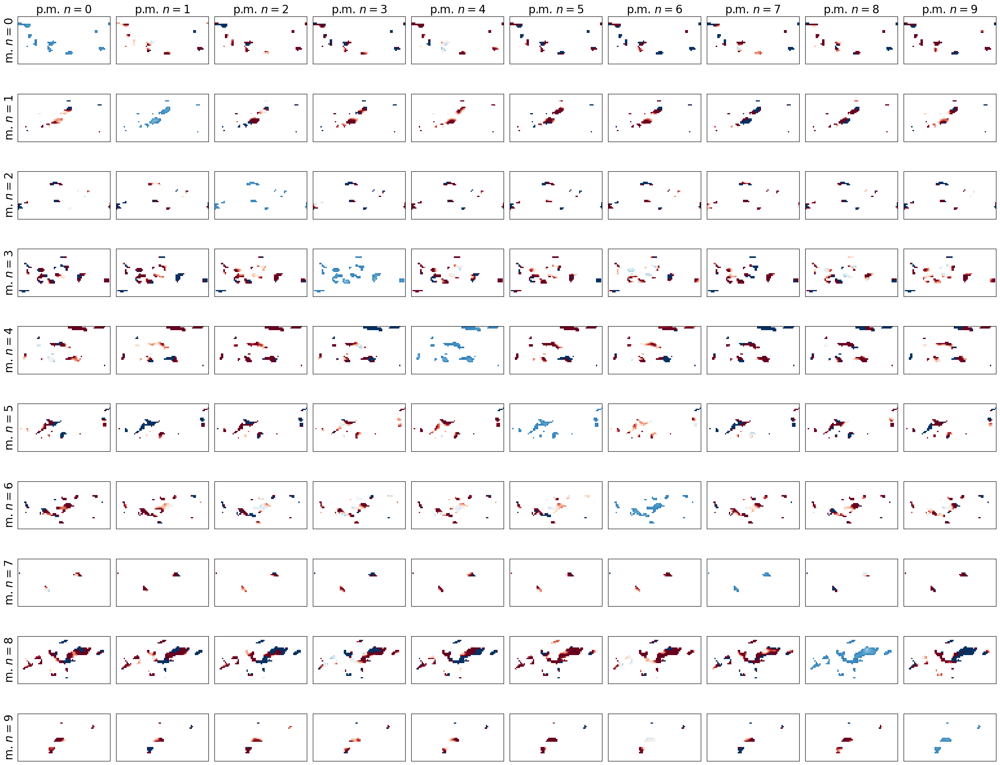

In [101]:
# Compare rho(model, obs) and rho(model, perfect_model) -> plots are rho(model, obs)/rho(model, perfect model),
#         models are the rows and perfect models are the columns. Diagonal has model=perfect model so denominator
#         is equal to 1. Only grid cells surpassing a minimum correlation skill to the observations are displayed.
N_TO_SHOW = 10
CORR_THRESHOLD = 0.3

fig, axs = plt.subplots(N_TO_SHOW, N_TO_SHOW, figsize=(25, 20))
axs = axs.flatten()
for i in range(N_TO_SHOW):
    for j in range(N_TO_SHOW):
        rho_pairwise = rho_o_pairwise[i, :, :] / rho_m_pairwise[i, j, :, :]
        rho_pairwise[rho_o_pairwise[i,:,:]<CORR_THRESHOLD] = np.nan
        axs[i*N_TO_SHOW + j].imshow(rho_pairwise, cmap='RdBu_r', vmin=0, vmax=2)
        if i==0:
            axs[i*N_TO_SHOW + j].set_title(f'p.m. $n={j}$', fontsize=20)
        if j==0:
            axs[i*N_TO_SHOW + j].set_ylabel(f'm. $n={i}$', fontsize=20)
remove_ticks(axs)
plt.tight_layout()

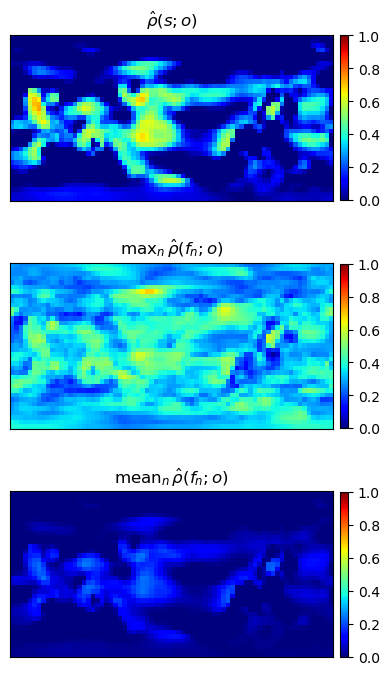

In [190]:
fig, axs = plt.subplots(3, 1, figsize=(4, 7))
im0 = axs[0].imshow(rho_o, cmap='jet', vmin=0, vmax=1)
im1 = axs[1].imshow(np.max(rho_o_pairwise, axis=0), cmap='jet', vmin=0, vmax=1)
im2 = axs[2].imshow(np.mean(rho_o_pairwise, axis=0), cmap='jet', vmin=0.0, vmax=1.0)
fig.colorbar(im0, ax=axs[0], fraction=0.0243, pad=0.02)
fig.colorbar(im1, ax=axs[1], fraction=0.0243, pad=0.02)
fig.colorbar(im2, ax=axs[2], fraction=0.0243, pad=0.02)

remove_ticks(axs)

axs[0].set_title('$\\hat \\rho(s; o)$', fontsize=12)
axs[1].set_title('max$_n\,\\hat \\rho(f_n; o)$', fontsize=12)
axs[2].set_title('mean$_n\,\\hat \\rho(f_n; o)$', fontsize=12)
plt.tight_layout()
# axs[2].set_title('$\\rho=\\rho_o/\\rho_m$', fontsize=17)

Text(0.5, 0.98, 'RPC$_j^{\\hat\\rho}=\\frac{\\text{max}_{n\\neq j}\\,\\hat \\rho(f_n; o)}{\\text{max}_{n\\neq j}\\,\\hat \\rho(f_n; f_j)}$')

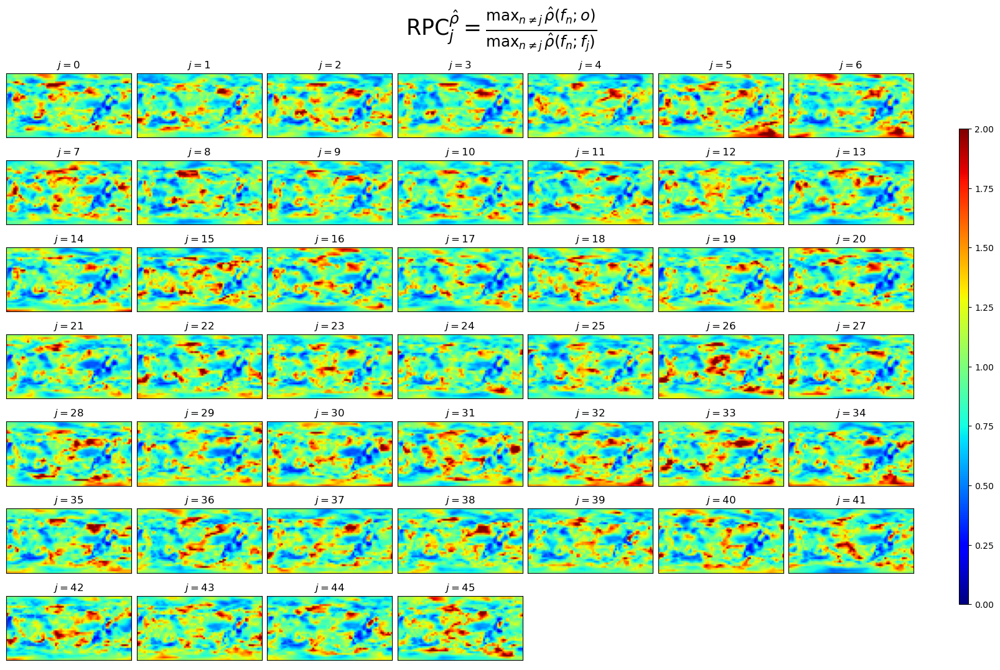

In [213]:
# 1. Add layout="compressed" to your figure initialization
fig, axs = plt.subplots(7, 7, figsize=(16, 12), layout="compressed")
axs = axs.flatten() 

for i in range(len(axs)):
    if i < rho_m_pairwise.shape[0]:
        # compute maximum potential skill of ensemble on obs
        obs_pairwise = rho_o_pairwise.copy() 
        obs_pairwise[i, :, :] = np.nan 
        rho_o_max = np.nanmax(obs_pairwise, axis=0)

        # compute maximum potential skill of ensemble on held-out member
        member_pairwise = rho_m_pairwise[i, :, :, :]
        member_pairwise[i, :, :] = np.nan
        rho_m_max = np.nanmax(member_pairwise, axis=0)

        # show "RPC"
        im = axs[i].imshow(rho_o_max / rho_m_max, vmin=0, vmax=2.0, cmap='jet')
        axs[i].set_title(f'$j={i}$')
    else:
        for spine in ["top", "bottom", "left", "right"]:
            axs[i].spines[spine].set_visible(False)
            
remove_ticks(axs)

# 2. Add your global colorbar
fig.colorbar(im, ax=axs.ravel(), orientation="vertical", shrink=0.8, aspect=50)   

# 3. Add suptitle (it naturally centers perfectly now)
plt.suptitle('RPC$_j^{\\hat\\rho}=\\frac{\\text{max}_{n\\neq j}\\,\\hat \\rho(f_n; o)}{\\text{max}_{n\\neq j}\\,\\hat \\rho(f_n; f_j)}$', fontsize=25)


Text(0.5, 0.98, 'RPC$_j=\\frac{\\text{mean}_{n\\neq j}\\,\\hat \\rho(f_n; o)}{\\text{mean}_{n\\neq j}\\,\\hat \\rho(f_n; f_j)}$')

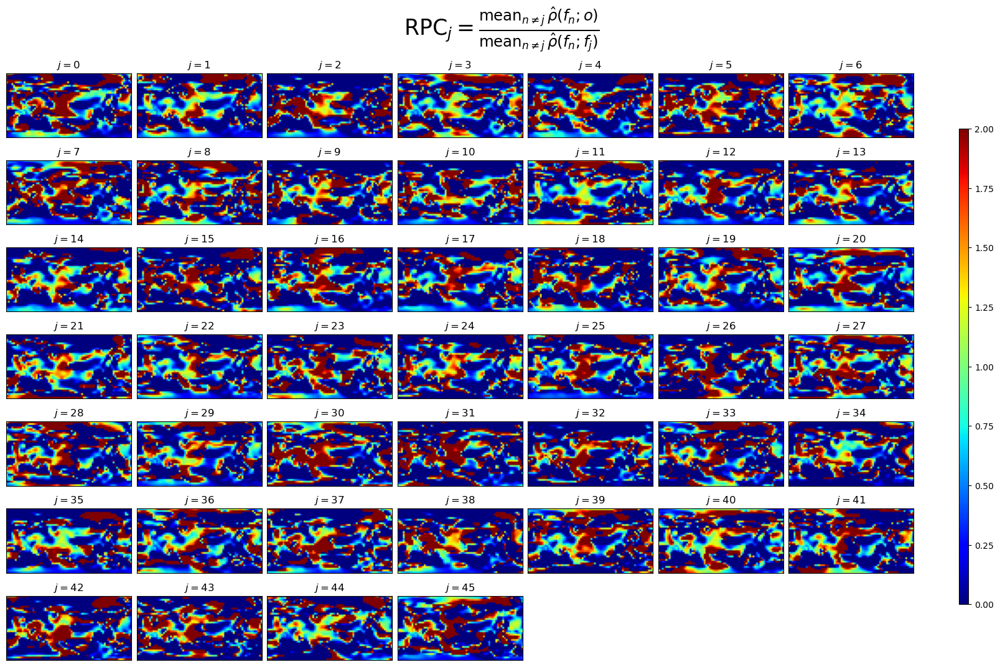

In [179]:
# 1. Add layout="compressed" to your figure initialization
fig, axs = plt.subplots(7, 7, figsize=(16, 12), layout="compressed")
axs = axs.flatten() 

for i in range(len(axs)):
    if i < rho_m_pairwise.shape[0]:
        # compute maximum potential skill of ensemble on obs
        obs_pairwise = rho_o_pairwise.copy() 
        obs_pairwise[i, :, :] = np.nan 
        rho_o_max = np.nanmean(obs_pairwise, axis=0)

        # compute maximum potential skill of ensemble on held-out member
        member_pairwise = rho_m_pairwise[i, :, :, :]
        member_pairwise[i, :, :] = np.nan
        rho_m_max = np.nanmean(member_pairwise, axis=0)

        # show "RPC"
        im = axs[i].imshow(rho_o_max / rho_m_max, vmin=0, vmax=2.0, cmap='jet')
        axs[i].set_title(f'$j={i}$')
    else:
        for spine in ["top", "bottom", "left", "right"]:
            axs[i].spines[spine].set_visible(False)
            
remove_ticks(axs)

# 2. Add your global colorbar
fig.colorbar(im, ax=axs.ravel(), orientation="vertical", shrink=0.8, aspect=50)   

# 3. Add suptitle (it naturally centers perfectly now)
plt.suptitle('RPC$_j=\\frac{\\text{mean}_{n\\neq j}\\,\\hat \\rho(f_n; o)}{\\text{mean}_{n\\neq j}\\,\\hat \\rho(f_n; f_j)}$', fontsize=25)


In [155]:
K_NN = 6

MI_FG_pairwise = np.nan * np.ones((F.shape[0], g.shape[1], g.shape[2]))
MI_sG = smyle_metrics.calc_MI_sG(s, g, k=K_NN, use_copula=True) 

for i in range(F.shape[0]):
    if (i+1)%5==0: 
        print(f'{i+1}/{F.shape[0]}')
    MI_FG_pairwise[i,:,:] = smyle_metrics.calc_MI_sG(F[i,:,:,:], g, k=K_NN, use_copula=True)

5/46
10/46
15/46
20/46
25/46
30/46
35/46
40/46
45/46


In [156]:
lam_o = smyle_metrics.lam_of(MI_sG)
lam_o_pairwise = smyle_metrics.lam_of(MI_FG_pairwise)

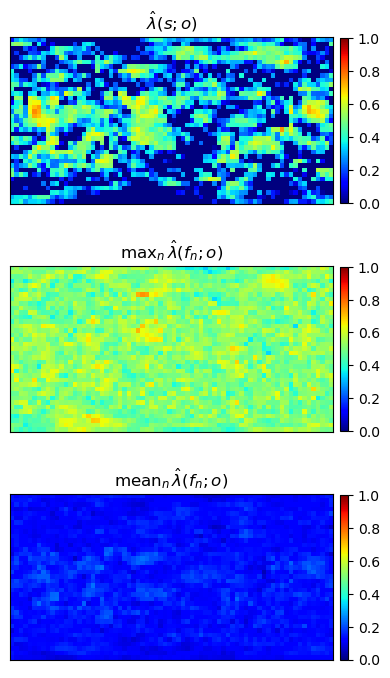

In [191]:
fig, axs = plt.subplots(3, 1, figsize=(4, 7))
im0 = axs[0].imshow(lam_o, cmap='jet', vmin=0, vmax=1)
im1 = axs[1].imshow(np.max(lam_o_pairwise, axis=0), cmap='jet', vmin=0, vmax=1)
im2 = axs[2].imshow(np.mean(lam_o_pairwise, axis=0), cmap='jet', vmin=0.0, vmax=1.0)
fig.colorbar(im0, ax=axs[0], fraction=0.0243, pad=0.02)
fig.colorbar(im1, ax=axs[1], fraction=0.0243, pad=0.02)
fig.colorbar(im2, ax=axs[2], fraction=0.0243, pad=0.02)

remove_ticks(axs)

axs[0].set_title('$\\hat \\lambda(s; o)$', fontsize=12)
axs[1].set_title('max$_n\,\\hat \\lambda(f_n; o)$', fontsize=12)
axs[2].set_title('mean$_n\,\\hat \\lambda(f_n; o)$', fontsize=12)
plt.tight_layout()
# axs[2].set_title('$\\rho=\\rho_o/\\rho_m$', fontsize=17)

In [158]:
MI_F_pairwise = np.load('../data/MI_F_pairwise_dcpp_SLP_13-60.npy')

In [172]:
lam_m_pairwise = smyle_metrics.lam_of(MI_F_pairwise)

Text(0.5, 0.98, 'RPC$_j^{\\hat\\lambda}=\\frac{\\text{max}_{n\\neq j}\\,\\hat \\lambda(f_n; o)}{\\text{max}_{n\\neq j}\\,\\hat \\lambda(f_n; f_j)}$')

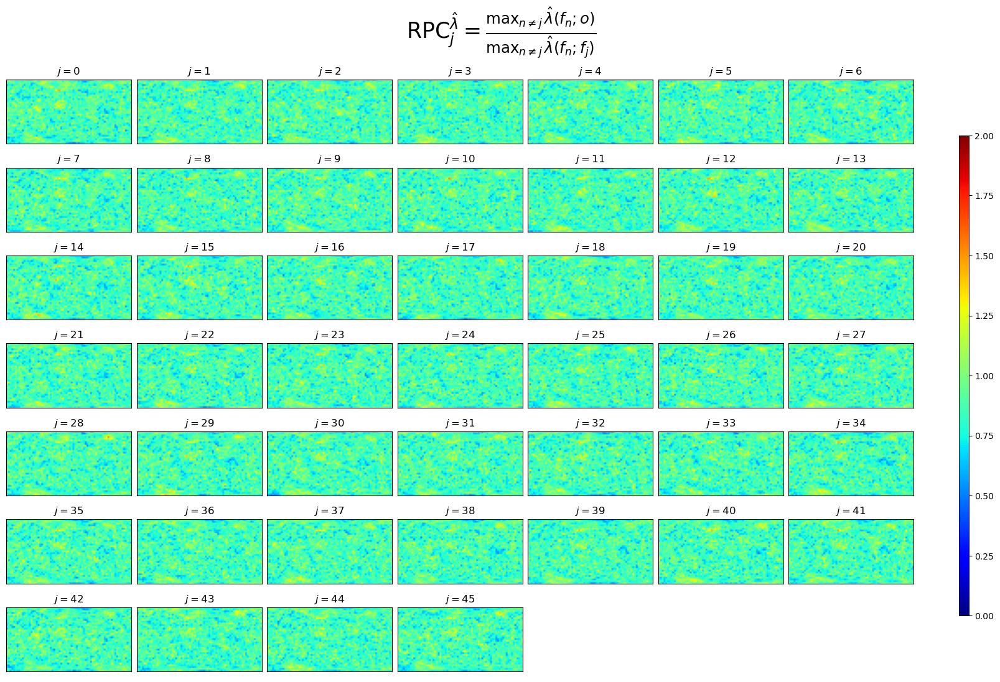

In [212]:
# 1. Add layout="compressed" to your figure initialization
fig, axs = plt.subplots(7, 7, figsize=(16, 12), layout="compressed")
axs = axs.flatten() 

for i in range(len(axs)):
    if i < rho_m_pairwise.shape[0]:
        # compute maximum potential skill of ensemble on obs
        obs_pairwise = lam_o_pairwise.copy() 
        obs_pairwise[i, :, :] = np.nan 
        lam_o_max = np.nanmax(obs_pairwise, axis=0)

        # compute maximum potential skill of ensemble on held-out member
        member_pairwise = lam_m_pairwise[i, :, :, :]
        member_pairwise[i, :, :] = np.nan
        lam_m_max = np.nanmax(member_pairwise, axis=0)

        # show "RPC"
        im = axs[i].imshow(lam_o_max / lam_m_max, vmin=0, vmax=2.0, cmap='jet')
        axs[i].set_title(f'$j={i}$')
    else:
        for spine in ["top", "bottom", "left", "right"]:
            axs[i].spines[spine].set_visible(False)
            
remove_ticks(axs)

# 2. Add your global colorbar
fig.colorbar(im, ax=axs.ravel(), orientation="vertical", shrink=0.8, aspect=50)   

# 3. Add suptitle (it naturally centers perfectly now)
plt.suptitle('RPC$_j^{\\hat\\lambda}=\\frac{\\text{max}_{n\\neq j}\\,\\hat \\lambda(f_n; o)}{\\text{max}_{n\\neq j}\\,\\hat \\lambda(f_n; f_j)}$', fontsize=25)


Text(0.5, 0.98, 'RPC$_j^{\\hat\\lambda}=\\frac{\\text{mean}_{n\\neq j}\\,\\hat \\lambda(f_n; o)}{\\text{mean}_{n\\neq j}\\,\\hat \\lambda(f_n; f_j)}$')

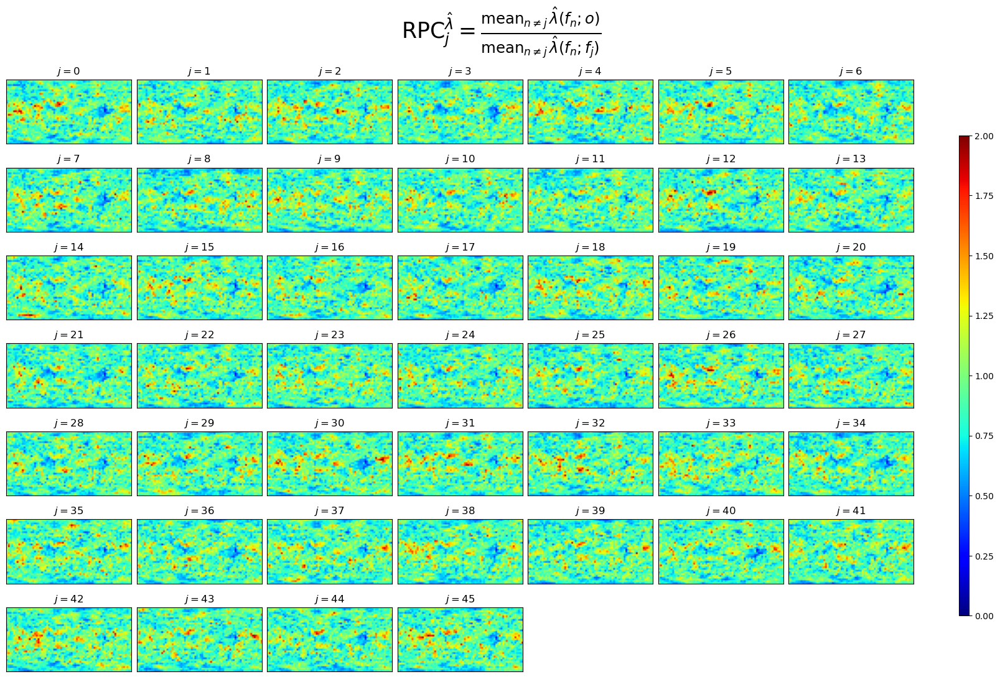

In [211]:
# 1. Add layout="compressed" to your figure initialization
fig, axs = plt.subplots(7, 7, figsize=(16, 12), layout="compressed")
axs = axs.flatten() 

for i in range(len(axs)):
    if i < rho_m_pairwise.shape[0]:
        # compute maximum potential skill of ensemble on obs
        obs_pairwise = lam_o_pairwise.copy() 
        obs_pairwise[i, :, :] = np.nan 
        lam_o_max = np.nanmean(obs_pairwise, axis=0)

        # compute maximum potential skill of ensemble on held-out member
        member_pairwise = lam_m_pairwise[i, :, :, :]
        member_pairwise[i, :, :] = np.nan
        lam_m_max = np.nanmean(member_pairwise, axis=0)

        # show "RPC"
        im = axs[i].imshow(lam_o_max / lam_m_max, vmin=0, vmax=2.0, cmap='jet')
        axs[i].set_title(f'$j={i}$')
    else:
        for spine in ["top", "bottom", "left", "right"]:
            axs[i].spines[spine].set_visible(False)
            
remove_ticks(axs)

# 2. Add your global colorbar
fig.colorbar(im, ax=axs.ravel(), orientation="vertical", shrink=0.8, aspect=50)   

# 3. Add suptitle (it naturally centers perfectly now)
plt.suptitle('RPC$_j^{\\hat\\lambda}=\\frac{\\text{mean}_{n\\neq j}\\,\\hat \\lambda(f_n; o)}{\\text{mean}_{n\\neq j}\\,\\hat \\lambda(f_n; f_j)}$', fontsize=25)


/tmp/ipykernel_27856/3950123586.py:40: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


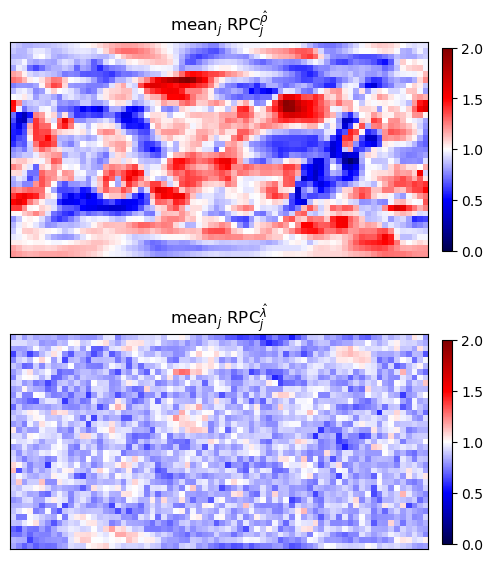

In [210]:
# 1. Add layout="compressed" to your figure initialization
fig, axs = plt.subplots(2, 1, figsize=(5, 6), layout="compressed")
axs = axs.flatten() 

N_MEMBER, N_LAT, N_LON = F.shape[0], F.shape[2], F.shape[3]
rho_RPC_arr = np.nan * np.ones((N_MEMBER, N_LAT, N_LON))
lam_RPC_arr = np.nan * np.ones((N_MEMBER, N_LAT, N_LON))

for i in range(N_MEMBER):
    # compute maximum potential skill of ensemble on obs
    lam_obs_pairwise = lam_o_pairwise.copy() 
    rho_obs_pairwise = rho_o_pairwise.copy() 
    lam_obs_pairwise[i, :, :] = np.nan 
    rho_obs_pairwise[i, :, :] = np.nan 
    lam_o_max = np.nanmax(lam_obs_pairwise, axis=0)
    rho_o_max = np.nanmax(rho_obs_pairwise, axis=0)

    # compute maximum potential skill of ensemble on held-out member
    lam_member_pairwise = lam_m_pairwise[i, :, :, :]
    rho_member_pairwise = rho_m_pairwise[i, :, :, :]
    lam_member_pairwise[i, :, :] = np.nan
    rho_member_pairwise[i, :, :] = np.nan
    lam_m_max = np.nanmax(lam_member_pairwise, axis=0)
    rho_m_max = np.nanmax(rho_member_pairwise, axis=0)

    rho_RPC_arr[i, :, :] = rho_o_max / rho_m_max 
    lam_RPC_arr[i, :, :] = lam_o_max / lam_m_max 

rho_RPC = np.mean(rho_RPC_arr, axis=0)
lam_RPC = np.mean(lam_RPC_arr, axis=0)

# show "RPC"
im0 = axs[0].imshow(rho_RPC, vmin=0, vmax=2.0, cmap='seismic')
im1 = axs[1].imshow(lam_RPC, vmin=0, vmax=2.0, cmap='seismic')
ims = [im0, im1]

axs[0].set_title('mean$_j$ RPC$_j^{\\hat\\rho}$')
axs[1].set_title('mean$_j$ RPC$_j^{\\hat\\lambda}$')
            
plt.tight_layout()
remove_ticks(axs)
add_colorbars(fig, ims, axs, fraction=0.023, pad=0.03)

In [77]:
K_NN = 4
MIsG = smyle_metrics.calc_MI_sG_LOOavg(F, g, k=K_NN, use_copula=True)
MIsF = smyle_metrics.calc_MI_sF(F, k=K_NN, use_copula=True)

In [50]:
MIsG_noCopula = smyle_metrics.calc_MI_sG_LOOavg(F, g, k=K_NN, use_copula=False)
MIsF_noCopula = smyle_metrics.calc_MI_sF(F, k=K_NN, use_copula=False)

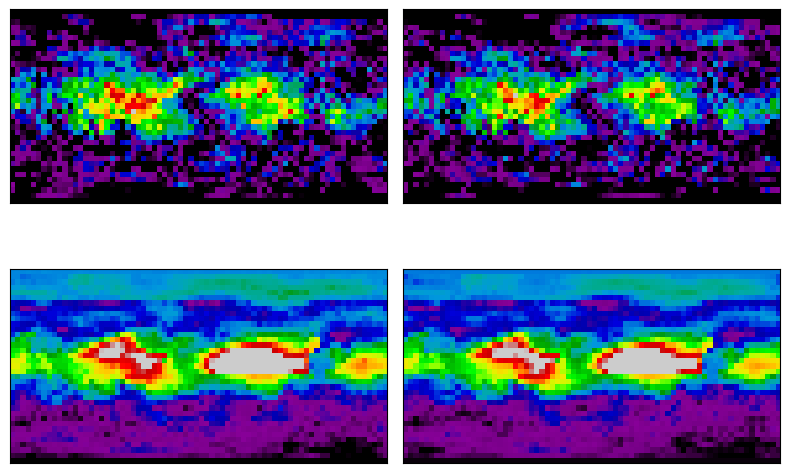

In [51]:
fig, axs = plt.subplots(2, 2, figsize=(8, 6))
axs = axs.flatten() 

CLIM = 0.7
CMAP = 'nipy_spectral'
axs[0].imshow(MIsG, vmin=0, vmax=CLIM, cmap=CMAP)
axs[1].imshow(MIsG_noCopula, vmin=0, vmax=CLIM, cmap=CMAP)
axs[2].imshow(MIsF, vmin=0, vmax=CLIM, cmap=CMAP)
axs[3].imshow(MIsF_noCopula, vmin=0, vmax=CLIM, cmap=CMAP)

remove_ticks(axs)
plt.tight_layout()

In [68]:
k_arr = [1, 3, 5, 7, 9, 11]
MIsG_k = []
for i, k in enumerate(k_arr):
    MIsG_k.append(smyle_metrics.calc_MI_sG_LOOavg(F, g, k=k_arr[i], use_copula=True)) 

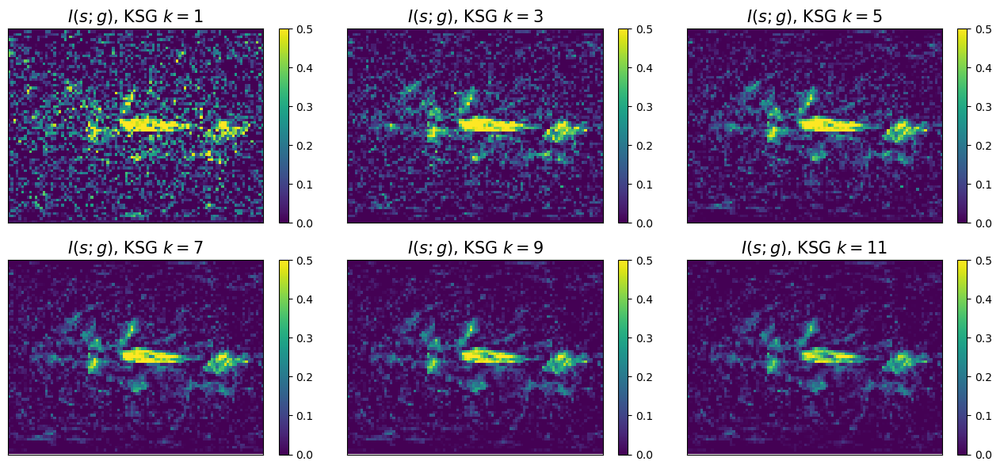

In [69]:
im_arr = [] 

fig, axs = plt.subplots(2, 3, figsize=(13, 6))
axs = axs.flatten()

for i in range(len(k_arr)):
    im_tmp = axs[i].imshow(MIsG_k[i], vmin=0, vmax=0.5)
    im_arr.append(im_tmp)
    axs[i].set_title(f'$I(s;g)$, KSG $k={k_arr[i]}$', fontsize=15)
add_colorbars(fig, im_arr, axs, pad=0.05)
remove_ticks(axs)
plt.tight_layout()

In [78]:
lam_o = smyle_metrics.lam_of(MIsG)
# lam_o[(MIsG<1e-3)] = np.nan
lam_m = smyle_metrics.lam_of(MIsF)
# lam_m[MIsG<1e-3] = np.nan

Text(0.5, 1.0, '$\\lambda=\\lambda_o/\\lambda_m$')

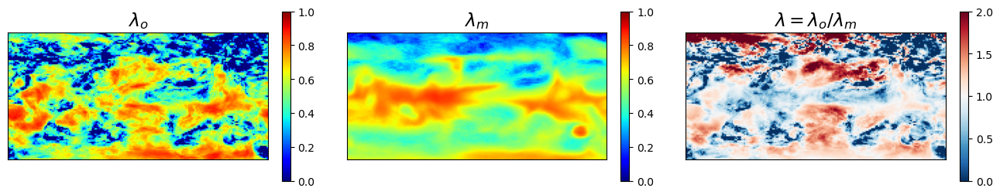

In [79]:
fig, axs = plt.subplots(1, 3, figsize=(16, 5))
im0 = axs[0].imshow(lam_o, cmap='jet', vmin=0, vmax=1)
im1 = axs[1].imshow(lam_m, cmap='jet', vmin=0, vmax=1)
im2 = axs[2].imshow(lam_o / lam_m, cmap='RdBu_r', vmin=0.0, vmax=2.0)
fig.colorbar(im0, ax=axs[0], fraction=0.03)
fig.colorbar(im1, ax=axs[1], fraction=0.03)
fig.colorbar(im2, ax=axs[2], fraction=0.03)
for i in range(3):
    axs[i].set_xticks([])
    axs[i].set_yticks([])

axs[0].set_title('$\\lambda_o$', fontsize=17)
axs[1].set_title('$\\lambda_m$', fontsize=17)
axs[2].set_title('$\\lambda=\\lambda_o/\\lambda_m$', fontsize=17)

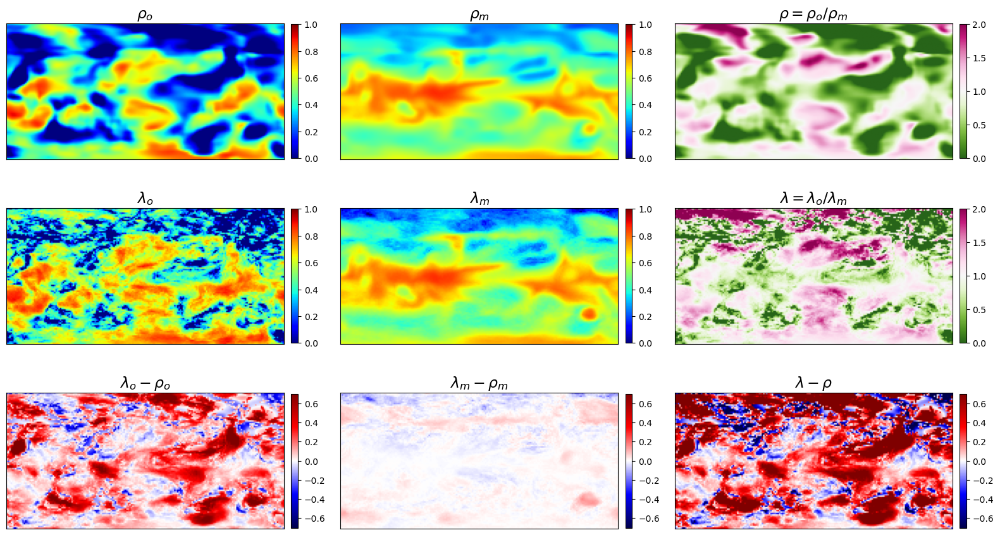

In [95]:
fig, axs = plt.subplots(3, 3, figsize=(16, 9))
axs = axs.flatten()

im0 = axs[0].imshow(rho_o, cmap='jet', vmin=0, vmax=1)
im1 = axs[1].imshow(rho_m, cmap='jet', vmin=0, vmax=1)
im2 = axs[2].imshow(rho_o / rho_m, cmap='PiYG_r', vmin=0.0, vmax=2.0)

im3 = axs[3].imshow(lam_o, cmap='jet', vmin=0, vmax=1)
im4 = axs[4].imshow(lam_m, cmap='jet', vmin=0, vmax=1)
im5 = axs[5].imshow(lam_o / lam_m, cmap='PiYG_r', vmin=0.0, vmax=2.0)

im6 = axs[6].imshow(lam_o - rho_o, vmin=-0.7, vmax=0.7, cmap='seismic')
im7 = axs[7].imshow(lam_m - rho_m, vmin=-0.7, vmax=0.7, cmap='seismic')
im8 = axs[8].imshow(lam_o/lam_m - rho_o/rho_m, vmin=-0.7, vmax=0.7, cmap='seismic')
im_arr = [im0, im1, im2, im3, im4, im5, im6, im7, im8] 

remove_ticks(axs)
add_colorbars(fig, im_arr, axs, fraction=0.023, pad=0.025)

axs[0].set_title('$\\rho_o$', fontsize=17)
axs[1].set_title('$\\rho_m$', fontsize=17)
axs[2].set_title('$\\rho=\\rho_o/\\rho_m$', fontsize=17)

axs[3].set_title('$\\lambda_o$', fontsize=17)
axs[4].set_title('$\\lambda_m$', fontsize=17)
axs[5].set_title('$\\lambda=\\lambda_o/\\lambda_m$', fontsize=17)

axs[6].set_title('$\\lambda_o - \\rho_o$', fontsize=17)
axs[7].set_title('$\\lambda_m - \\rho_m$', fontsize=17)
axs[8].set_title('$\\lambda - \\rho$', fontsize=17)

plt.tight_layout()